# ASSIGNMENT 3
## Using DATASET 5

In [2]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from random import sample
import seaborn as sns
import itertools
import os

In [3]:
facebook_edges_filepath = "/Users/michaelmbajwa/Desktop/Semester3/ComplexNetworks/Complex-Networks_exercise-main/Datasets/Group5/Facebook-Ego/686.edges"
twitter_edges_filepath = "/Users/michaelmbajwa/Desktop/Semester3/ComplexNetworks/Complex-Networks_exercise-main/Datasets/Group5/Twitter-Ego/1435461.edges"

In [4]:
# Load the /.edges files
# Facebook is an undirected network
graphFacebook = nx.read_edgelist(facebook_edges_filepath, create_using=nx.Graph())

# Twitter is a directed network
graphTwitter = nx.read_edgelist(twitter_edges_filepath, create_using=nx.DiGraph())

In [5]:
# Basic attributes check
print("Number of nodes={}, edges={} in facebook graph.".format(graphFacebook.number_of_nodes(), graphFacebook.number_of_edges()))
print("Number of nodes={}, edges={} in Twitter graph.".format(graphTwitter.number_of_nodes(), graphTwitter.number_of_edges()))

Number of nodes=168, edges=1656 in facebook graph.
Number of nodes=129, edges=8037 in Twitter graph.


<P>The number of nodes in the Facebook graph is 168. This will be factored in all the questions of Assignment 3<P>

In [6]:
# Function for getting combination of parameters
def all_combinations(a, b):
    """
    Args:
        a (list): set of parameters 1
        b (list): set of parameters 2
    """
    result = list(itertools.product(a, b))
    return result

In [7]:
# Function for plotting and saving degree distribution
def plot_save_degree_dist(G, id, params, path):
    """_summary_
    Returns plot of degree distribution and saves the plot to the system
    Args:
        degrees (_type_): each degree present in the network in a list format
        deg_count (_type_): each degree count in a list format
        id (_type_): name of the network
    """
    degree_seq = sorted([d for n, d in G.degree()], reverse=True)
    plt.rcdefaults()
    plt.rcParams['figure.figsize'] = (15, 8)
    fig, ax = plt.subplots()
    ax.set_facecolor('white')
    ax.hist(degree_seq, color="firebrick")
    
    # Beautify the plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_color('#DDDDDD')

    # Remove axis ticks.
    ax.tick_params(bottom=False, left=False)
    ax.set_axisbelow(True)
    ax.yaxis.grid(True, color='#EEEEEE')
    ax.xaxis.grid(False)
    
    ax.set_ylabel("Number of Nodes", labelpad=15, color='#333333')
    ax.set_xlabel("Degree", labelpad=15, color='#333333')
    ax.set_title("Degree Distribution for {} graph with {}".format(id, params), pad=15, color='#333333',
             weight='bold')
    ax.margins(0)
    
    fig.tight_layout()
    plt.savefig(path + '/' + '{}_degreeDistribution_{}.png'.format(id, params), transparent=False)
    return


# Plot clustering coefficient
def plot_clustering_coefficient(G, id, params, path):
    plt.rcdefaults()
    plt.rcParams['figure.figsize'] = (15, 8)
    fig, ax = plt.subplots()
    ax.set_facecolor('white')
    if id == "scale_free":
        ax.hist(nx.clustering(G, weight="weight").values(), color="royalblue")
    else:
        ax.hist(nx.clustering(G).values(), color="royalblue")
    
     # Beautify the plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_color('#DDDDDD')

    # Remove axis ticks.
    ax.tick_params(bottom=False, left=False)
    ax.set_axisbelow(True)
    ax.yaxis.grid(True, color='#EEEEEE')
    ax.xaxis.grid(False)
    
    
    ax.set_title("Clustering coefficient for {} graph with {}".format(id, params), pad=15, color='#333333',
             weight='bold')
    ax.set_xlabel("Clustering Coefficient", labelpad=15, color='#333333')
    ax.set_ylabel("Count", labelpad=15, color='#333333')
    ax.margins(0)
    
    fig.tight_layout()
    plt.savefig(path + '/' + '{}_clusteringCoefficient_{}.png'.format(id, params), transparent=False)
    return
  

# Plot graph structure
def plot_graph_structure(G, id, params, path):
    plt.rcdefaults()
    plt.rcParams['figure.figsize'] = (15, 8)
    fig, ax = plt.subplots()
    ax.set_facecolor('white')
    ax.set_title("{} graph structure for {}".format(id, params), pad=15, color='#333333',
             weight='bold')
    ax.set_facecolor('white')
    nx.draw_networkx(G, node_size=10, with_labels=False, arrowstyle='-', arrowsize=1, node_color='indigo', edge_color='lightgray')
    fig.tight_layout()
    plt.savefig(path + "/" +"{}_graphStructure_{}.png".format(id, params), transparent=False)
    return


def plots_directory(path):
    Isexists = os.path.exists(path)
    if not Isexists:
        os.makedirs(path)
    return

In [8]:
import random
random.uniform(0,1)

0.3833304601269162

## QUESTION A

### Generate graphs based on Watts-Strogatz Model, and each of them should have the same number of nodes as Facebook-Ego. Please generate 9 graphs with three different values of  ̄k and p. Please plot the graph structures, degree distributions, and clustering coefficients as well

/var/folders/kn/w_kcz5bn00d0d1404zh0hz280000gn/T/ipykernel_877/1027440516.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


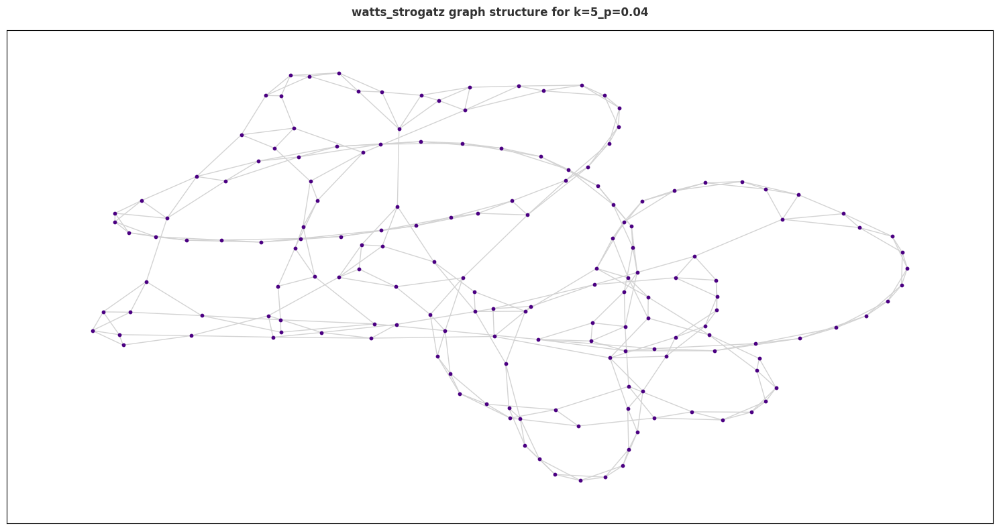

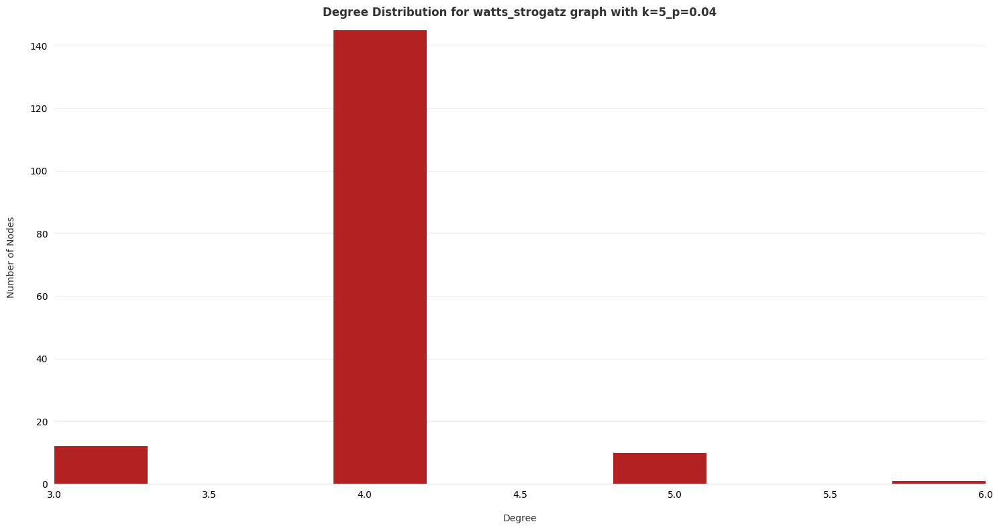

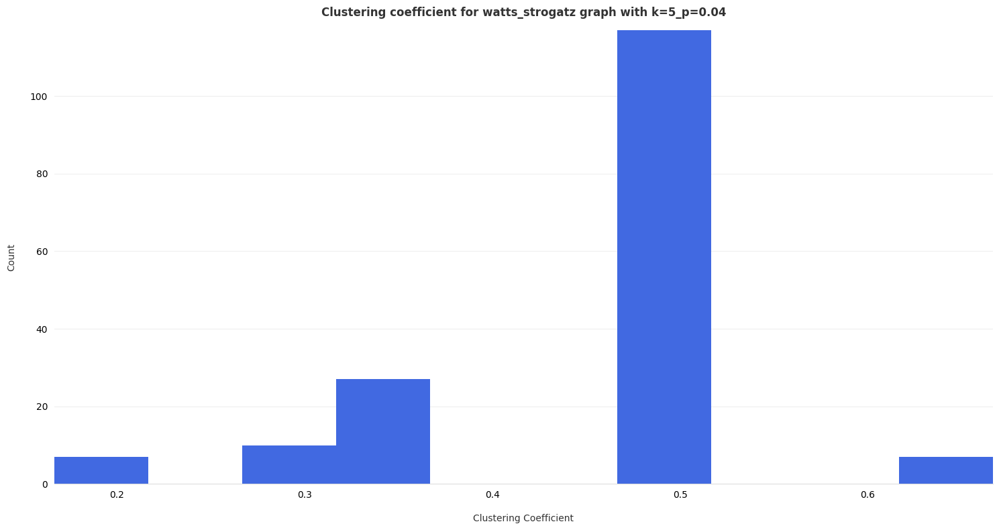

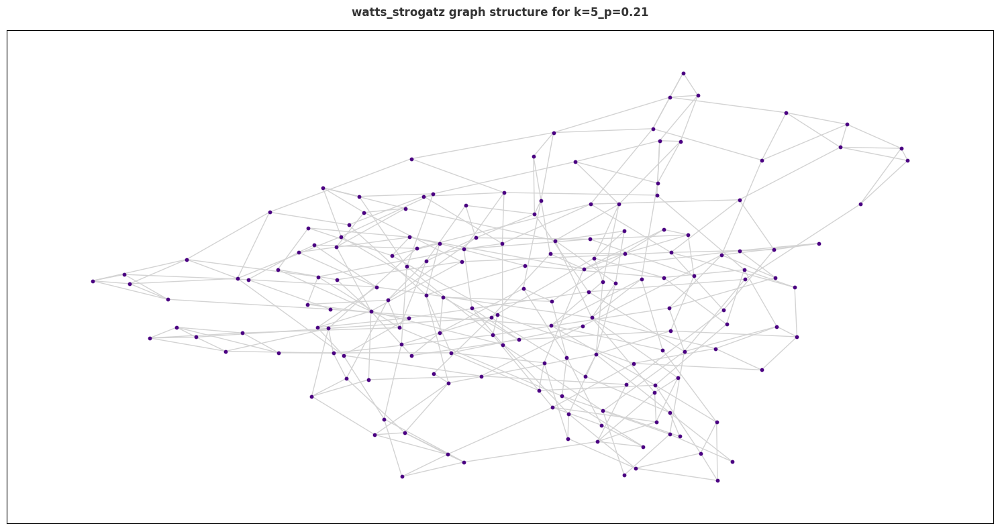

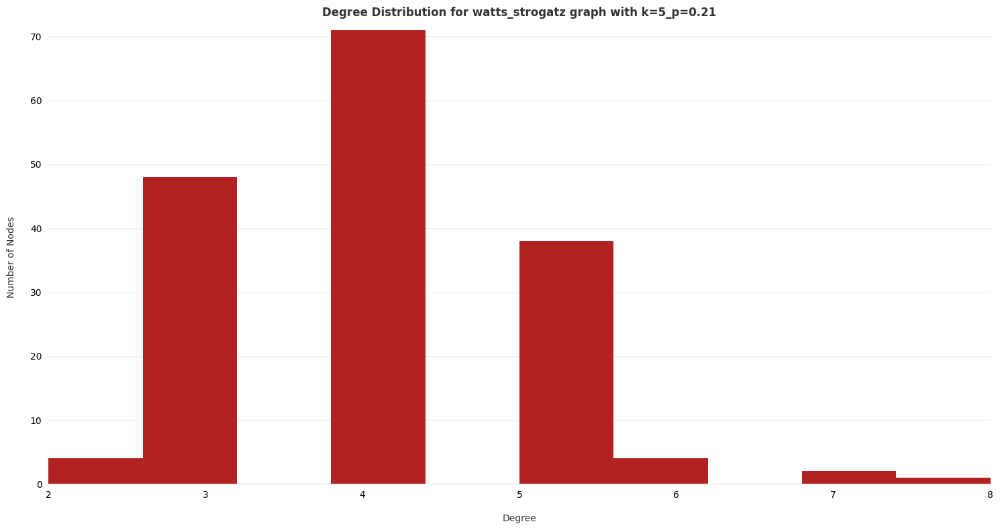

...

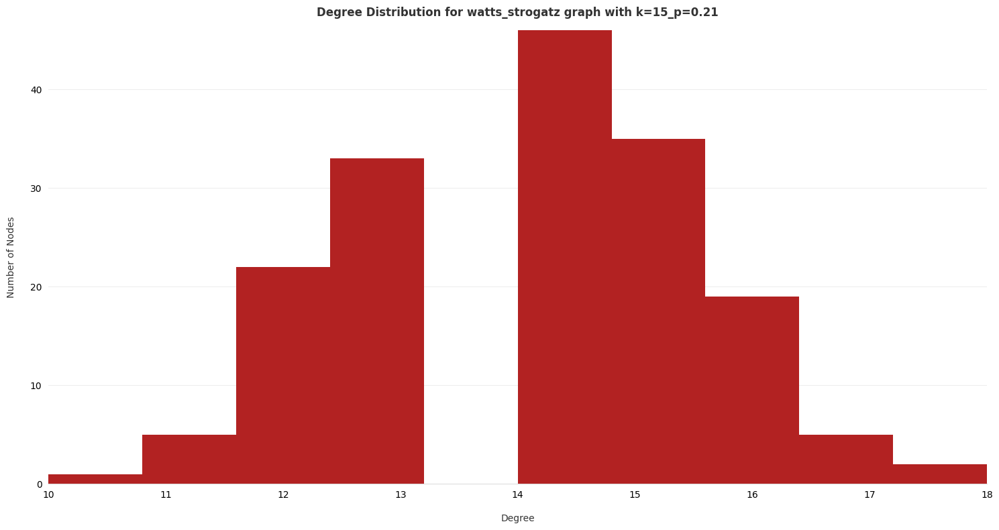

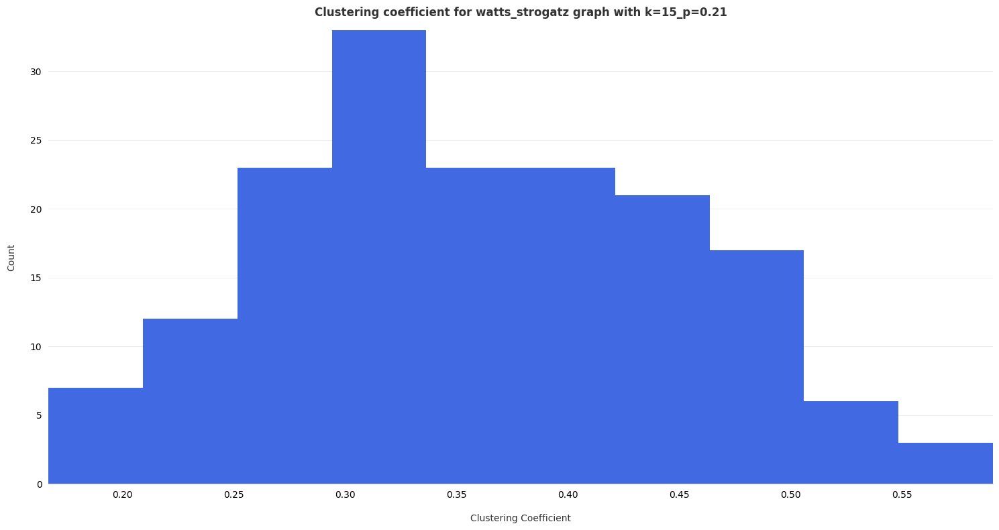

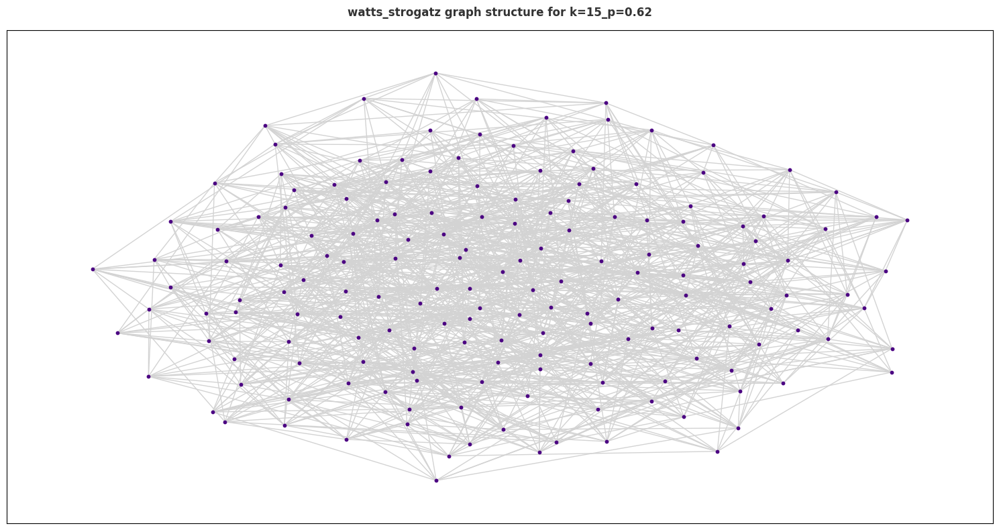

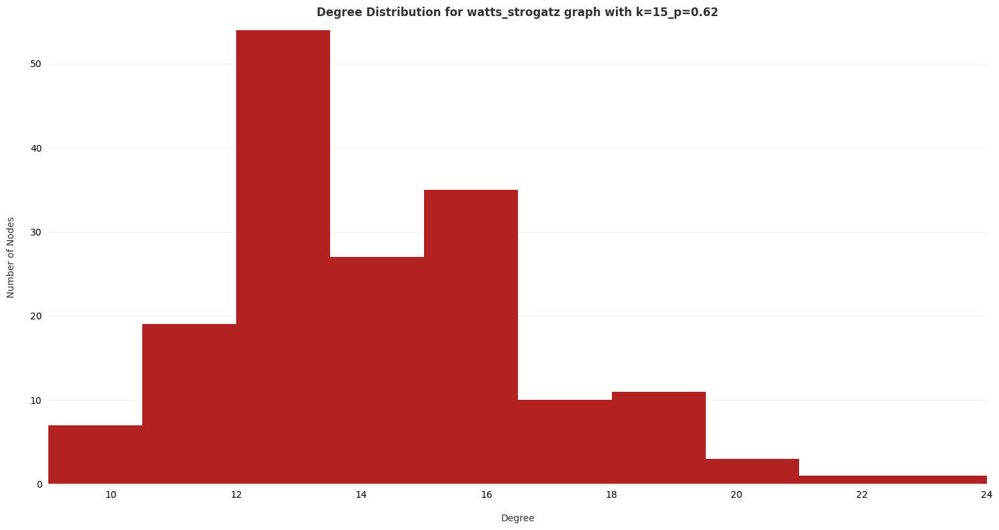

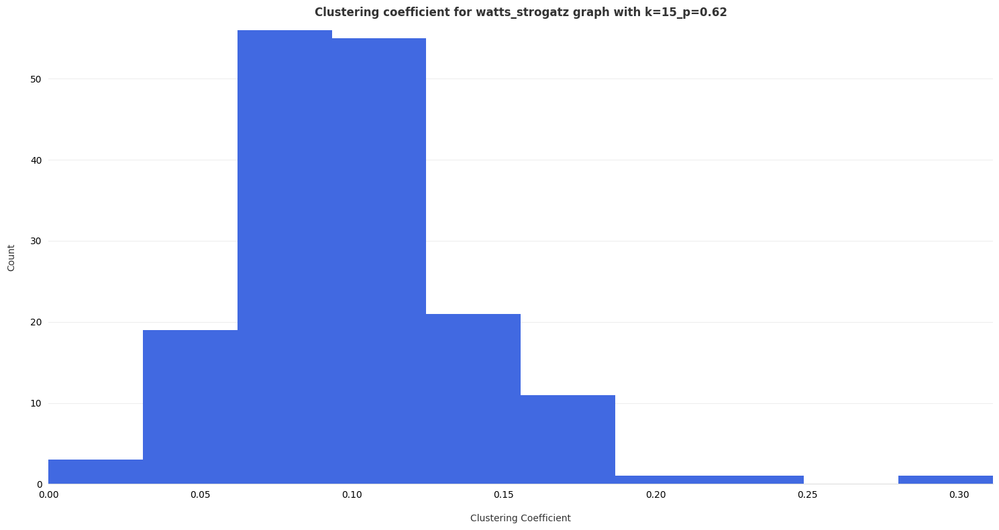

In [9]:
# watts_strogatz_graph
nodes = 168
k = [5, 10, 15]

# I generated random values for p
p = [0.04, 0.21, 0.62]

# Generate all combinations of parameters
parameters = all_combinations(k, p)
id = "watts_strogatz"

for k, p in parameters:
    params = "k={}".format(k) + "_" + "p={}".format(p)
    path = "QuestionA/" + id + "_" + params
    G = nx.watts_strogatz_graph(n=nodes,k=k, p=p, seed=42)
    plots_directory(path)
    plot_graph_structure(G, id=id, params=params, path=path)
    plot_save_degree_dist(G, id=id, params=params, path=path)
    plot_clustering_coefficient(G, id=id, params=params, path=path)
    

## Question B
### Generate scale-free graphs, and each of them should have the same number of nodes as Facebook-Ego. Please generate 3 graphs with three different values of γ. Please plot the graph structures, degree distributions, and clustering coefficients as well.

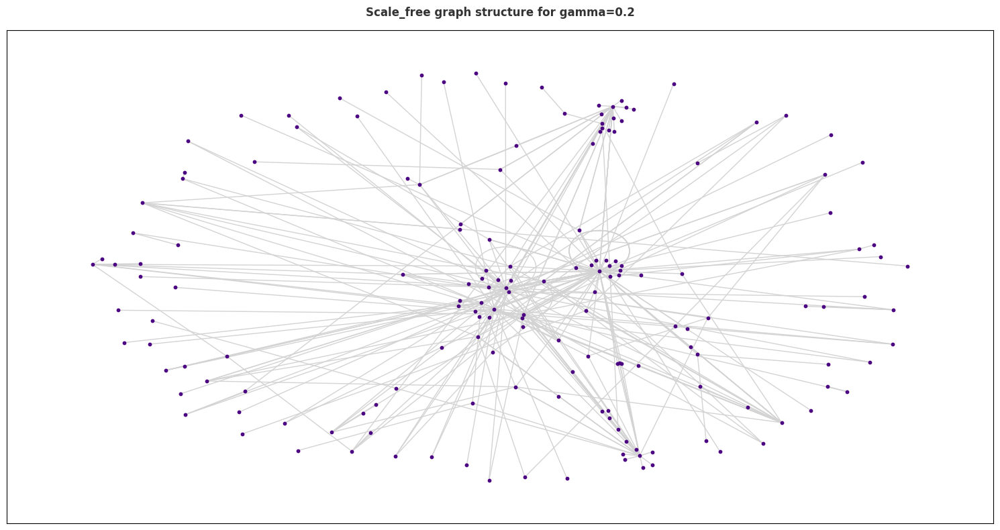

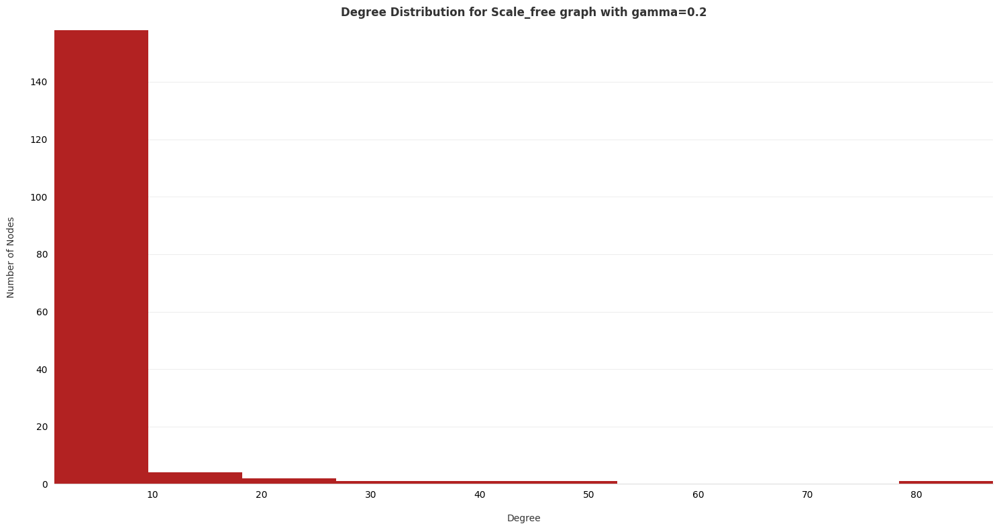

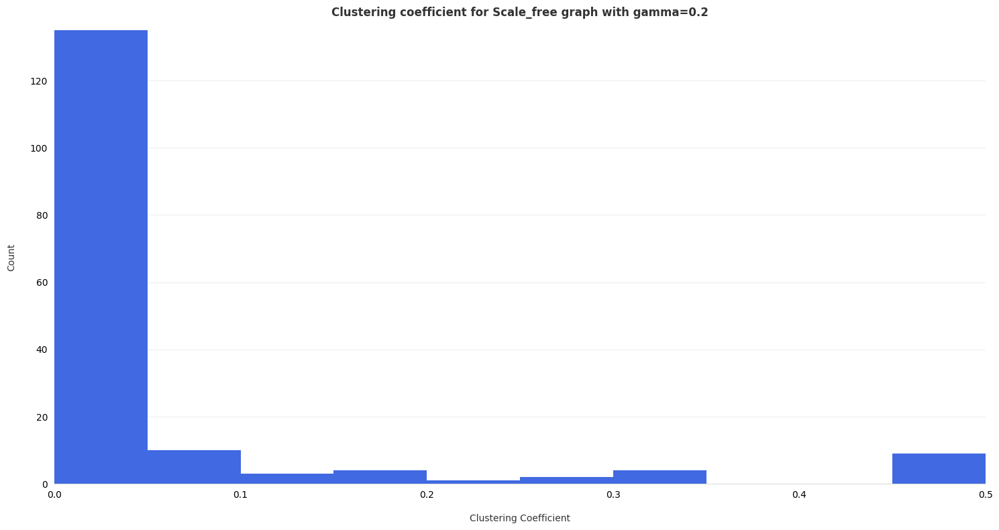

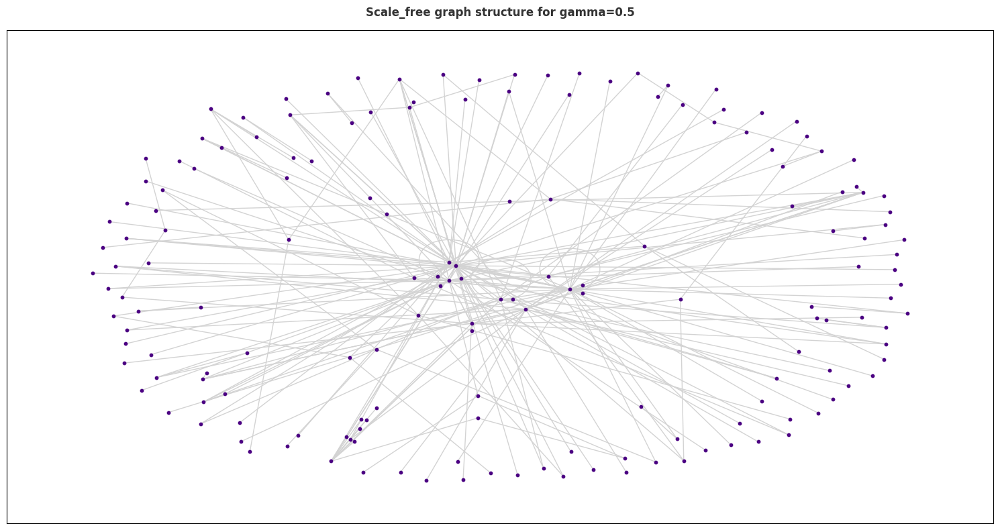

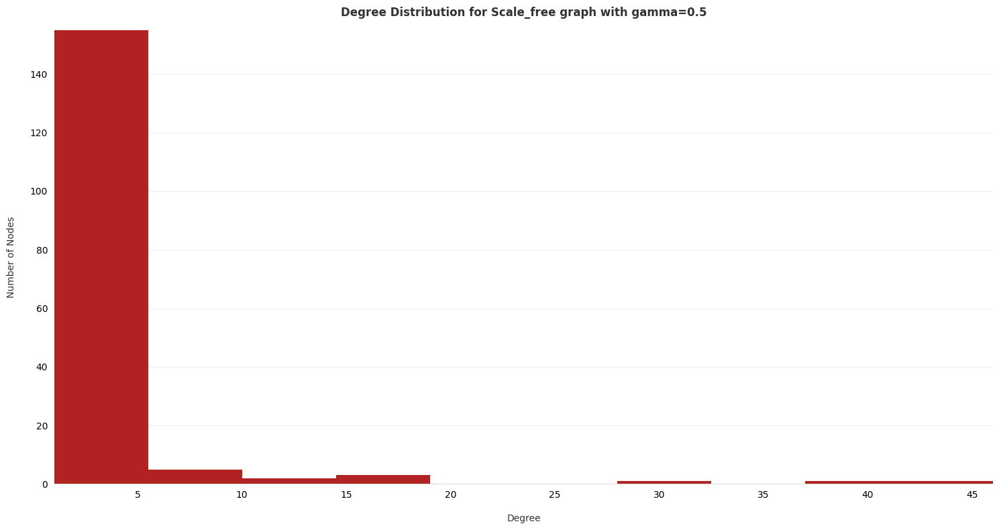

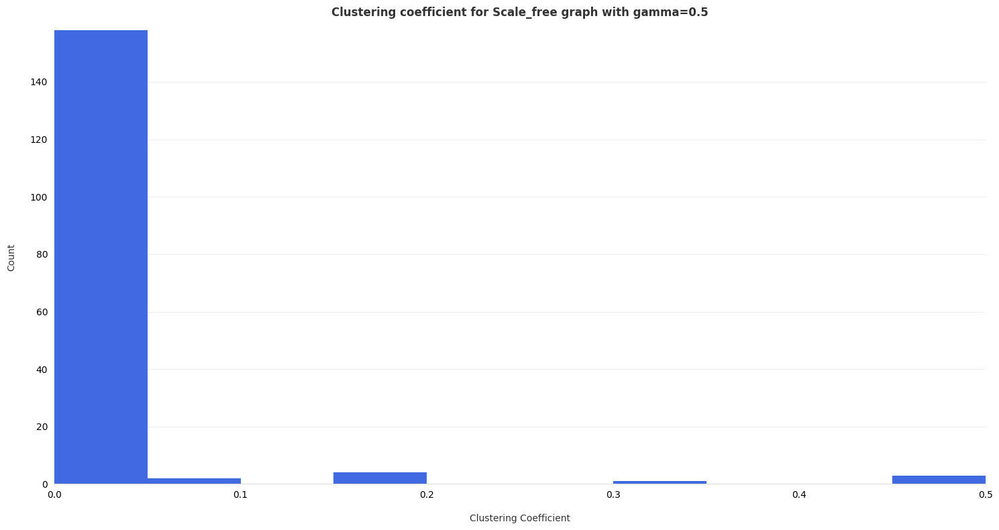

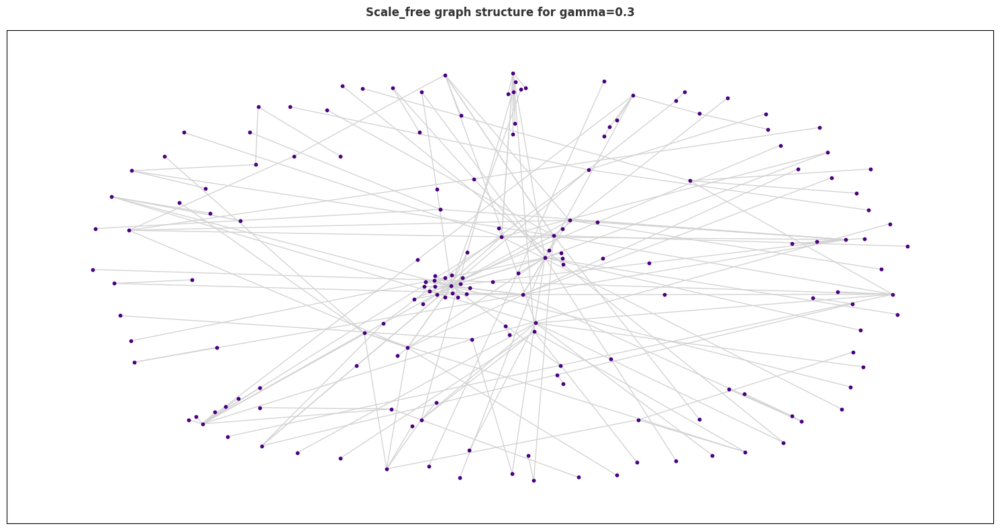

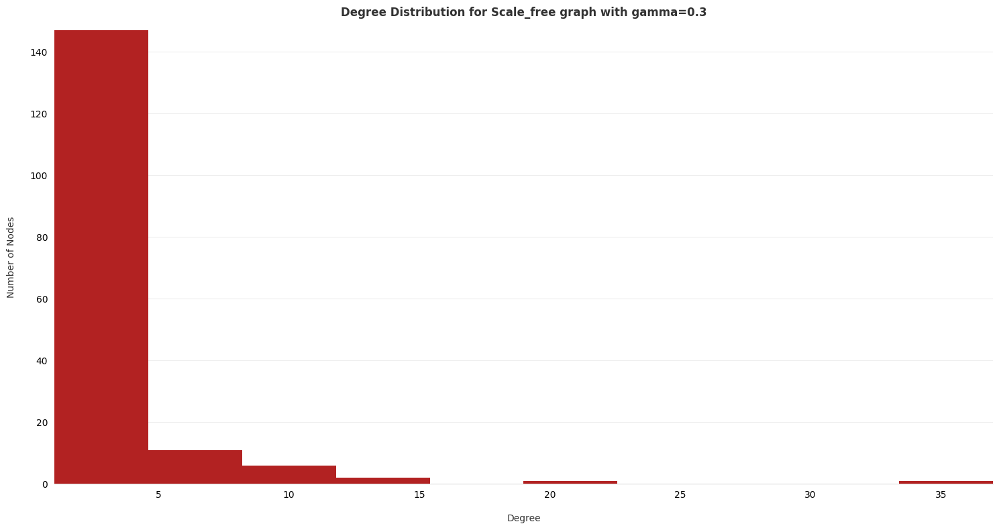

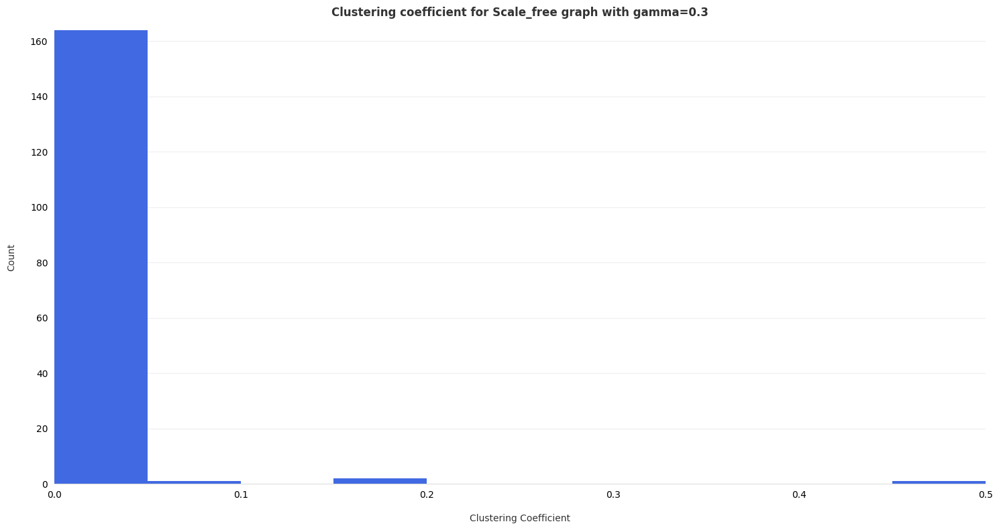

In [10]:
gamma = [0.2, 0.5, 0.3]
id = "Scale_free"
for i in range(3):
    g = gamma[i]
    params = "gamma={}".format(g)
    path = "QuestionB/" + id + "_" + params
    G = nx.scale_free_graph(n=nodes, alpha=gamma[i-1], beta=1-(gamma[i-1]+gamma[i]), gamma=g, seed=0)
    plots_directory(path)
    plot_graph_structure(G, id=id, params=params, path=path)
    plot_save_degree_dist(G, id=id, params=params, path=path)
    
    # Since nx.scale_free_graph returns a MultiDigraph in Networkx and the function nx.clustering does not work for MultiDiGraphs
    # I will convert the returned MulitiDigraph to a weighted DiGraph before calculating the clustering coefficient
    
    new_G = nx.DiGraph()
    for a, b in G.edges():
        if new_G.has_edge(a, b):
            new_G[a][b]['weight'] += 1
        else:
            new_G.add_edge(a, b, weight=1)
    
    plot_clustering_coefficient(new_G, id=id, params=params, path=path)

## Question C
### Generate graphs based on Barab ́asi-Albert Model, and each of them should have the same number of nodes as Facebook-Ego. Please generate 9 graphs with three different values of m0 and m. Please plot the graph structures, degree distributions, and clustering coefficients as well.

/var/folders/kn/w_kcz5bn00d0d1404zh0hz280000gn/T/ipykernel_877/1027440516.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


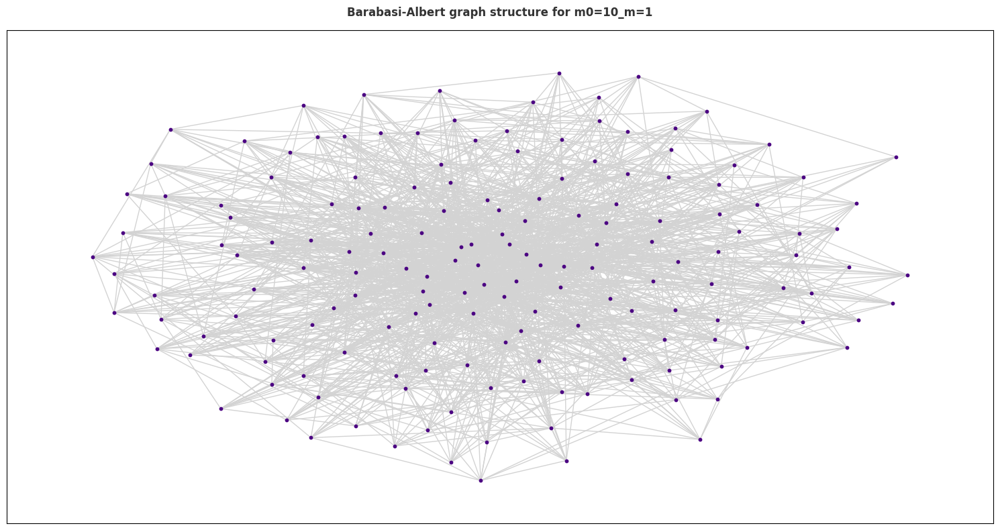

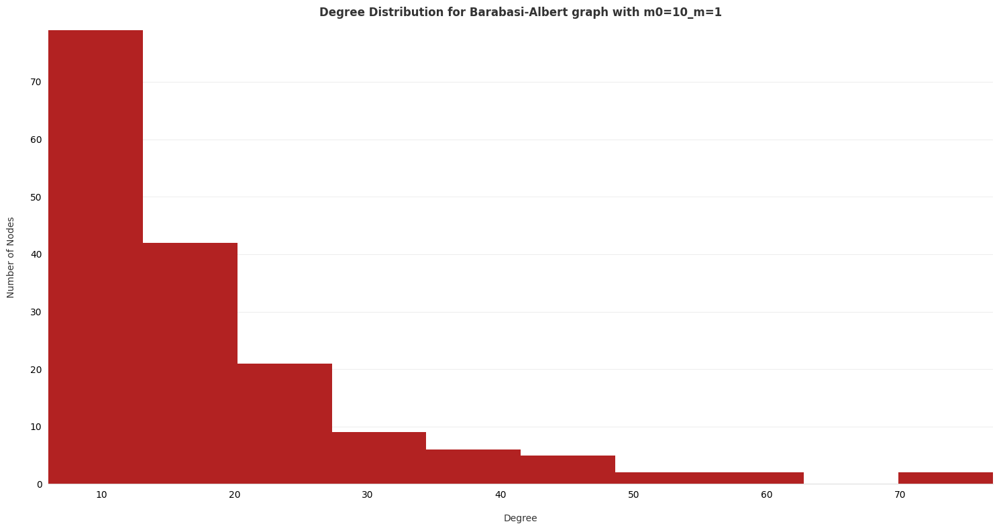

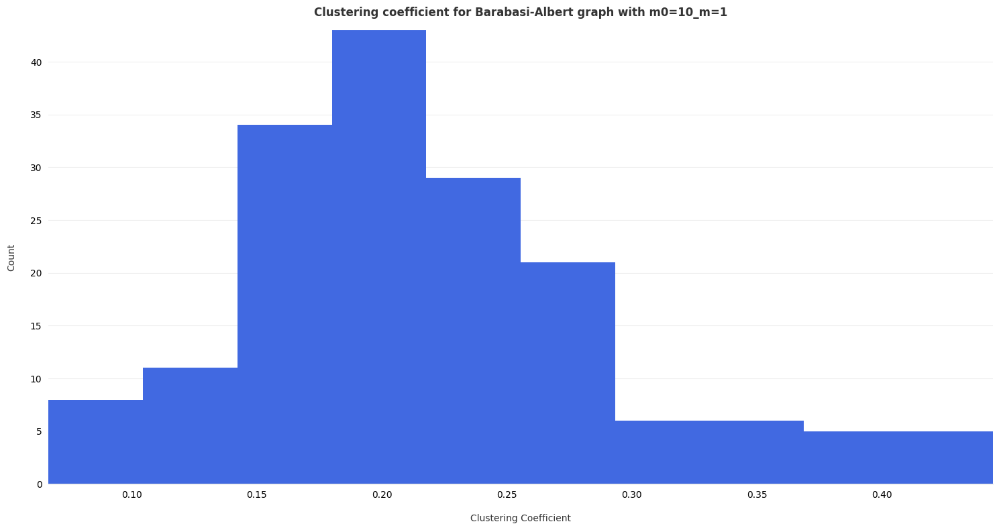

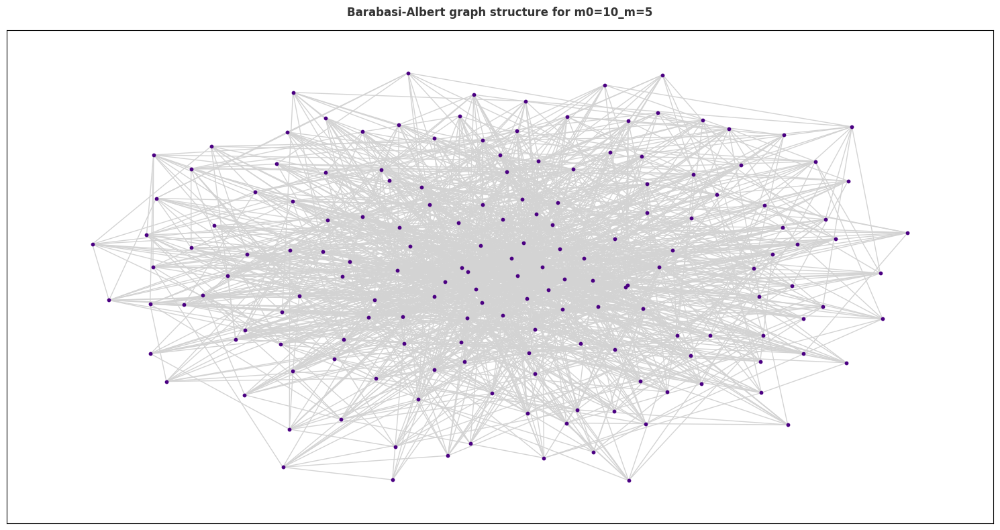

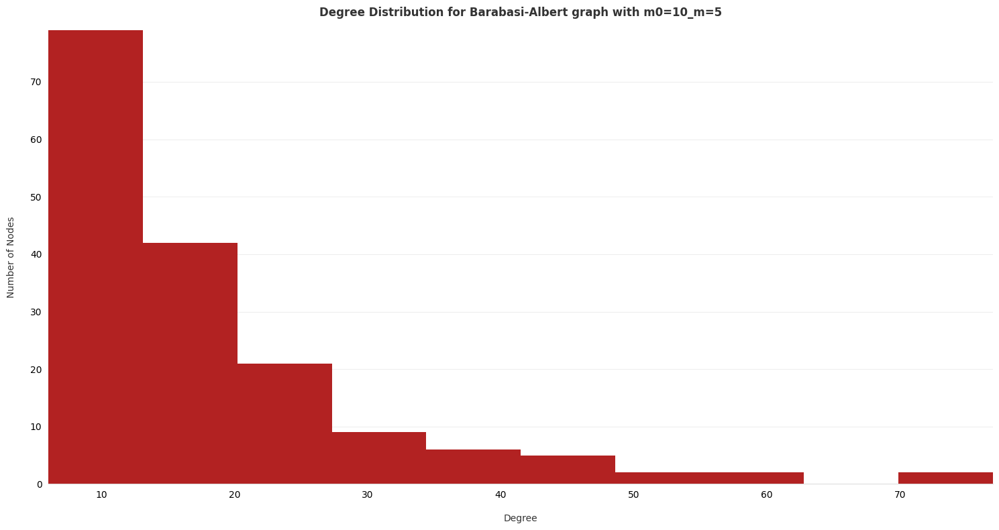

...

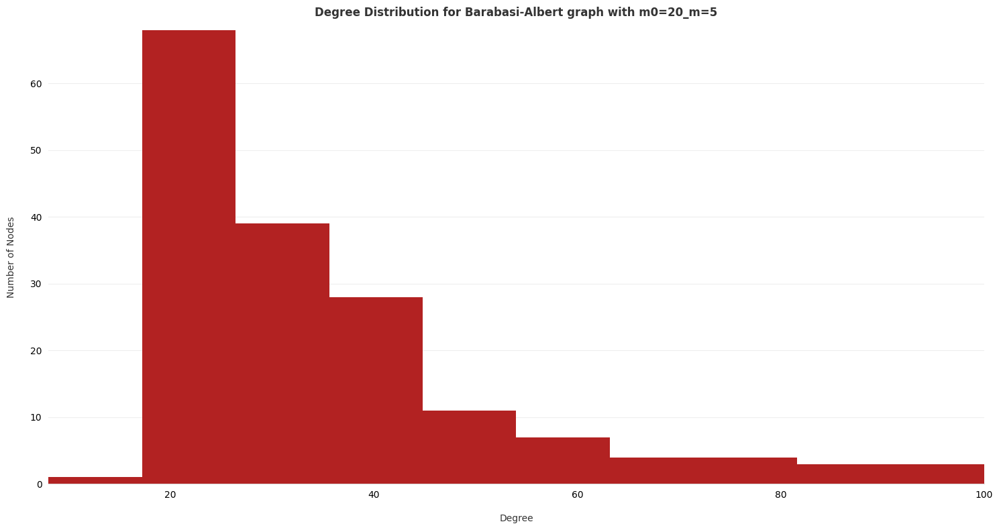

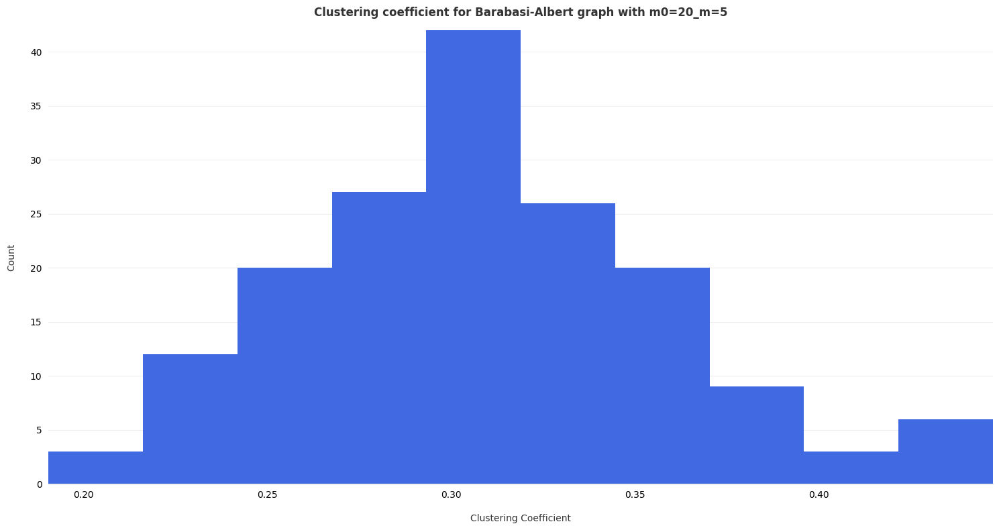

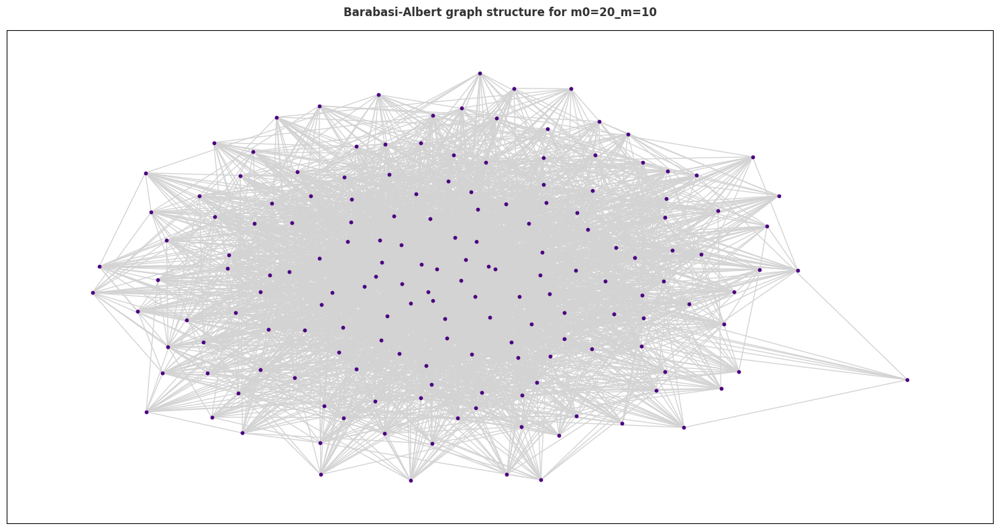

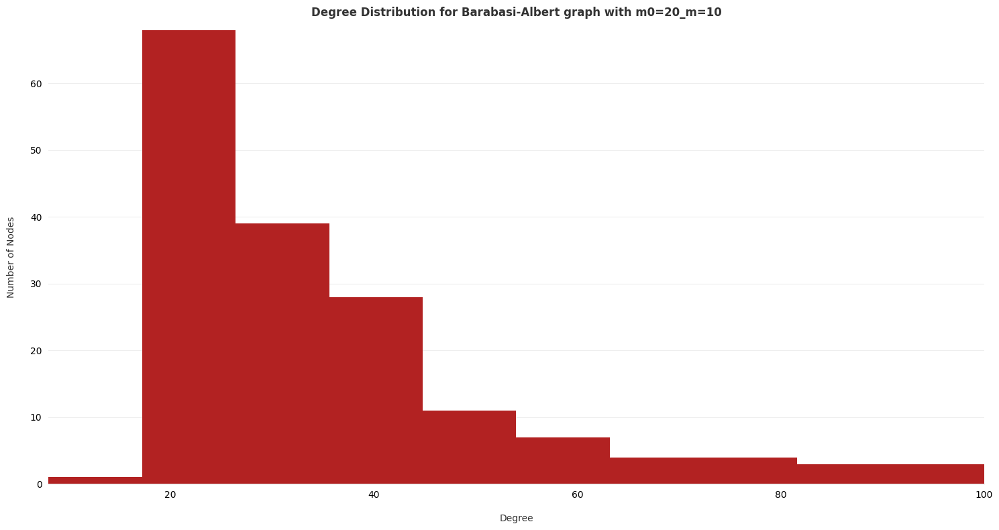

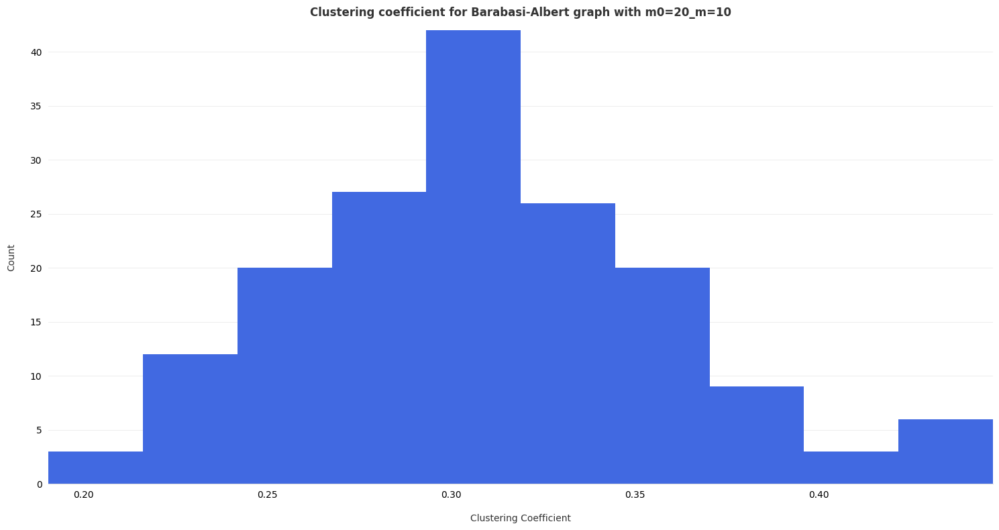

In [11]:
# Barabasi-Albert model with condition m <= m0 <= n.
nodes = 168
m_0 = [10, 15, 20]
m_ = [1, 5, 10]

# Generate all combinations of parameters
parameters = all_combinations(m_0, m_)
id = "Barabasi-Albert"

for m0, m in parameters:
    params = "m0={}".format(m0) + "_" + "m={}".format(m)
    path = "QuestionC/" + id + "_" + params
    init_graph = nx.barabasi_albert_graph(n=nodes, m=m0, seed=42)
    G=nx.barabasi_albert_graph(n=nodes, m=m, initial_graph=init_graph, seed=42)
    plots_directory(path)
    plot_graph_structure(G, id=id, params=params, path=path)
    plot_save_degree_dist(G, id=id, params=params, path=path)
    plot_clustering_coefficient(G, id=id, params=params, path=path)

## Question D
### Please compare your Facebook-Ego network, Twitter-Ego network with the generated random graphs in (a), (b) and (c). Which random graph(s) approximates your networks at most? Why?

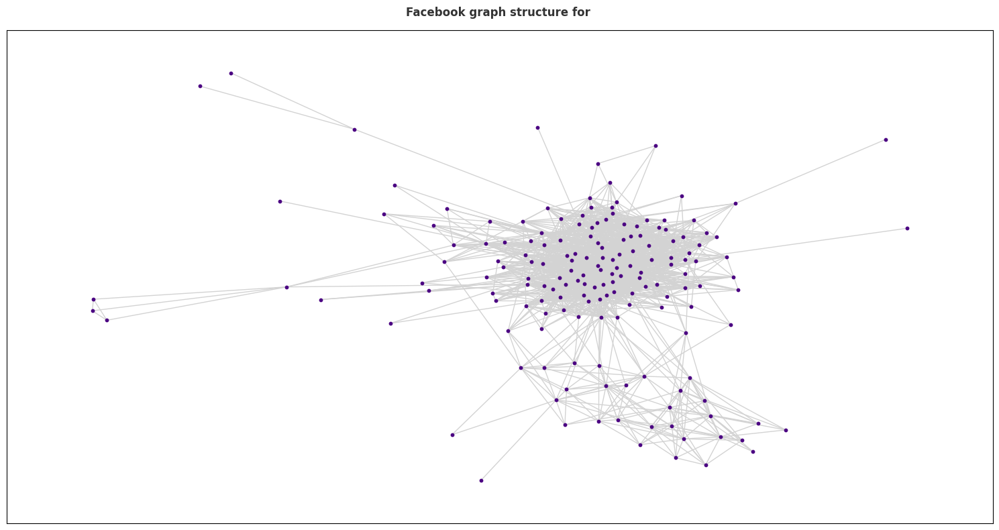

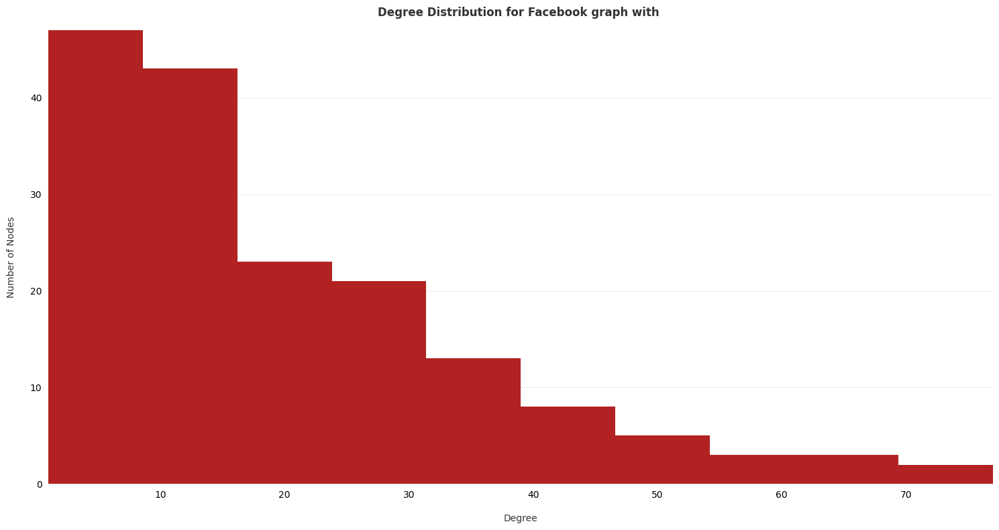

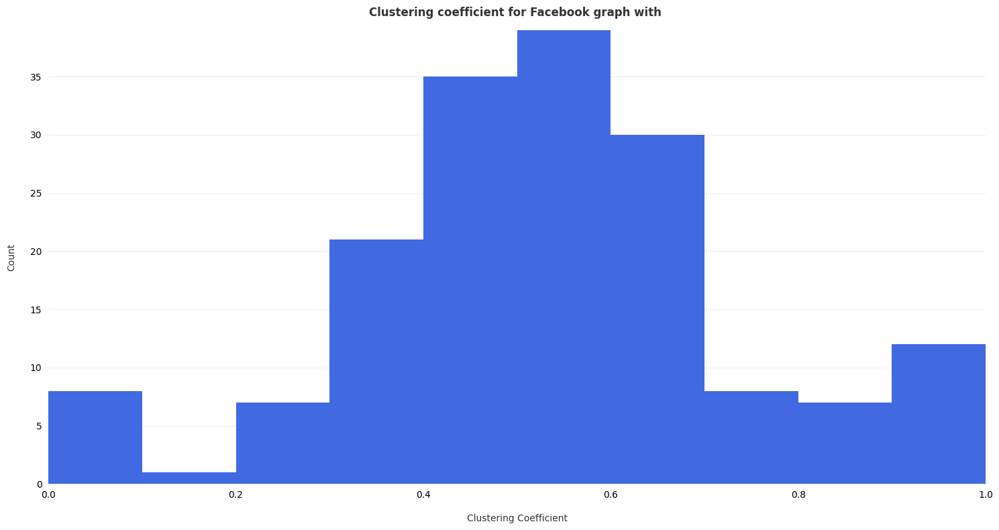

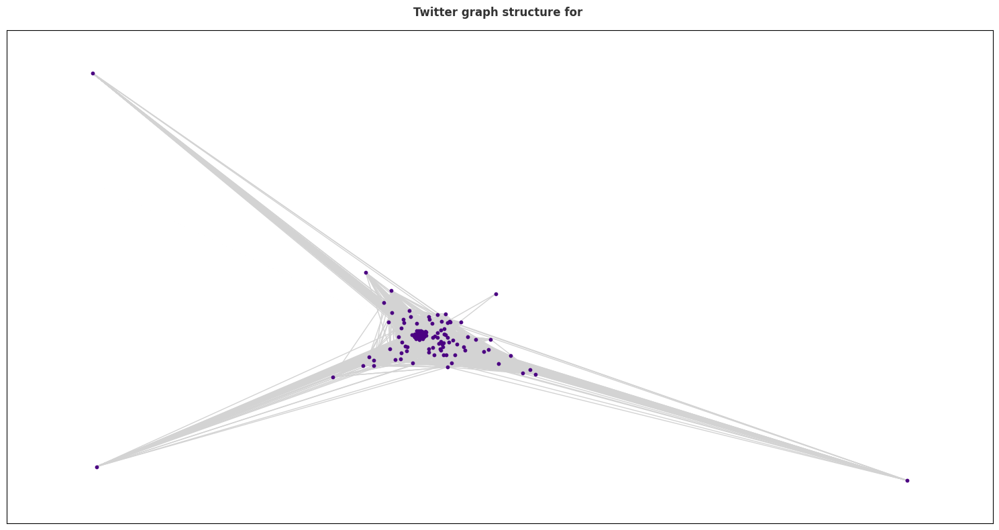

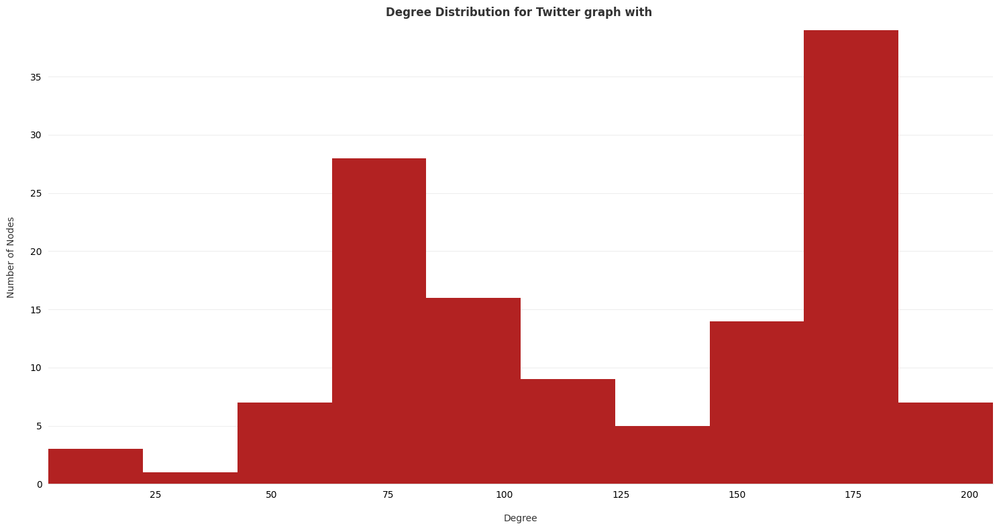

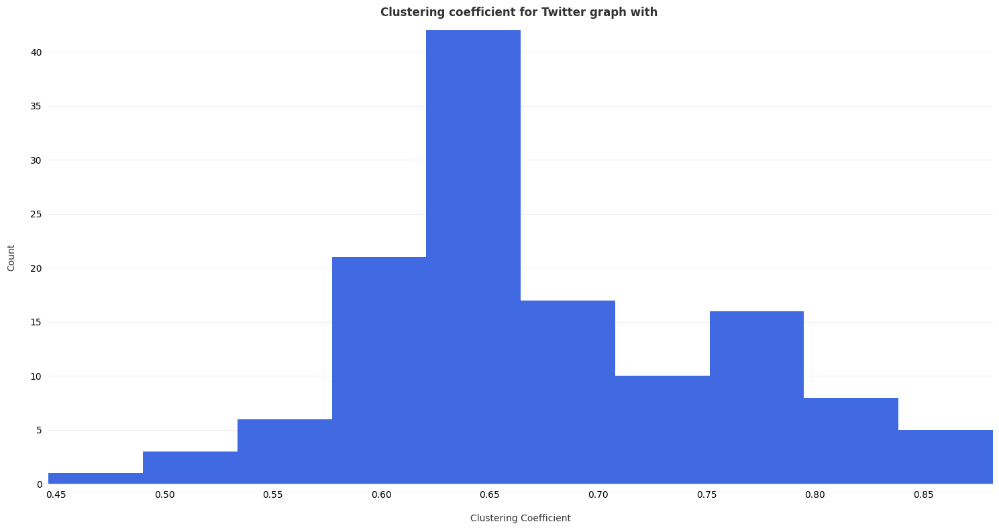

In [12]:
the_graphs = [(graphFacebook, "Facebook"), (graphTwitter, "Twitter")]
for G, id in the_graphs:
    params = ""
    path=id + "_Graph"
    plots_directory(path)
    plot_graph_structure(G, id=id, params=params, path=path)
    plot_save_degree_dist(G, id=id, params=params, path=path)
    plot_clustering_coefficient(G, id=id, params=params, path=path)